In [429]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

plt.style.use('fivethirtyeight')
from warnings import filterwarnings
filterwarnings('ignore')

In [247]:
with open('HR_data.csv') as f:
    df =  pd.read_csv(f, usecols=['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident',
       'promotion_last_5years'])
f.close()

In [248]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
0,0.38,0.53,2,157,3,0,0
1,0.80,0.86,5,262,6,0,0
2,0.11,0.88,7,272,4,0,0
3,0.72,0.87,5,223,5,0,0
4,0.37,0.52,2,159,3,0,0


In [249]:
scaler = StandardScaler()
scaler.fit(df)
X_scale = scaler.transform(df)

df_scale = pd.DataFrame(X_scale, columns=df.columns)
df_scale.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
0,-0.936495,-1.087275,-1.462863,-0.882040,-0.341235,-0.411165,-0.147412
1,0.752814,0.840707,0.971113,1.220423,1.713436,-0.411165,-0.147412
2,-2.022479,0.957554,2.593763,1.420657,0.343655,-0.411165,-0.147412
3,0.431041,0.899131,0.971113,0.439508,1.028546,-0.411165,-0.147412
4,-0.976716,-1.145699,-1.462863,-0.841993,-0.341235,-0.411165,-0.147412


In [251]:
for c in df_scale.columns:
    print(df_scale[c].skew())

-0.4763603412839654
-0.026621749863759526
0.33770561235982194
0.05284198941632429
1.8533190474339156
2.0211487384567084
6.636968380523419


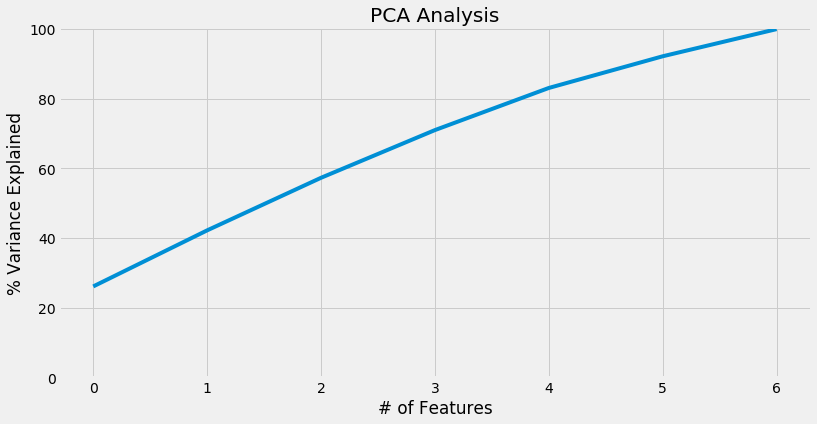

In [253]:
# The original dataset contains 7 eatures but we can see that PCA can reduce that down to 3 and still 
#  maintain 80% of the variance.  

covar_matrix = PCA(n_components=7)
covar_matrix.fit(df_scale)
variance = covar_matrix.explained_variance_ratio_ #calculate variance ratios

var=np.cumsum(np.round(variance, 3)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)


plt.plot(var)

In [279]:
# since clustering algorithms have issues with high dimenional datasets (ie. 3+ features) let's reduce PCA and t-SNE
#PCA
# 
pca = PCA(n_components=3)
pca.fit(df_scale)
pca_scale = pca.transform(df_scale)

pca_df = pd.DataFrame(pca_scale, columns=['pc1', 'pc2', 'pc3'])
print(pca.explained_variance_ratio_)

[0.26143604 0.16093156 0.1514701 ]


In [281]:
pca_df.head(15)

,pc1,pc2,pc3
0,-1.900350,-1.120831,-0.079779
1,2.135832,0.249337,0.093616
2,3.058916,-1.683127,-0.301682
3,1.550277,0.125511,-0.091630
4,-1.904444,-1.168134,-0.072386
5,-2.043794,-1.091075,-0.058925
6,1.992200,-1.896576,-0.138884
7,1.816024,0.803183,-0.229025
8,1.886153,0.924925,-0.260846
9,-2.079403,-1.023723,-0.062782


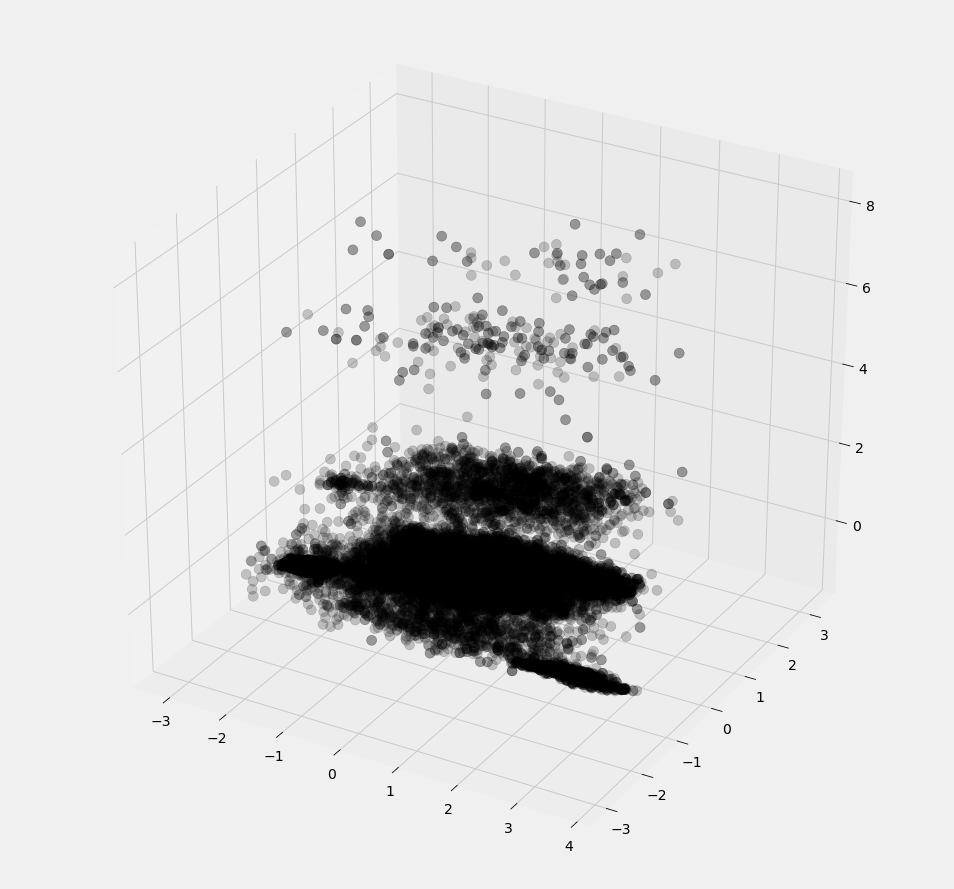

In [430]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_df.iloc[:,0], pca_df.iloc[:,1], pca_df.iloc[:,2], color='black', s=100, alpha=0.2)

In [432]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))

trace = go.Scatter3d(x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2], mode='markers',marker=dict(colorscale='Greys', opacity=0.3, size = 10, ))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

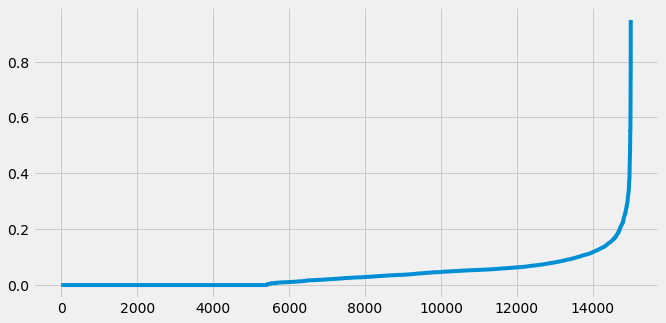

In [296]:
plt.figure(figsize=(10,5))
nbrs = NearestNeighbors(n_neighbors=5).fit(pca_df)
distances, idx = nbrs.kneighbors(pca_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()

In [437]:
db = DBSCAN(eps=0.2, min_samples=6).fit(pca_df)
labels = db.labels_

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(pca_df, labels))

Estimated number of clusters: 53
Estimated number of noise points: 1579
Silhouette Coefficient: -0.521


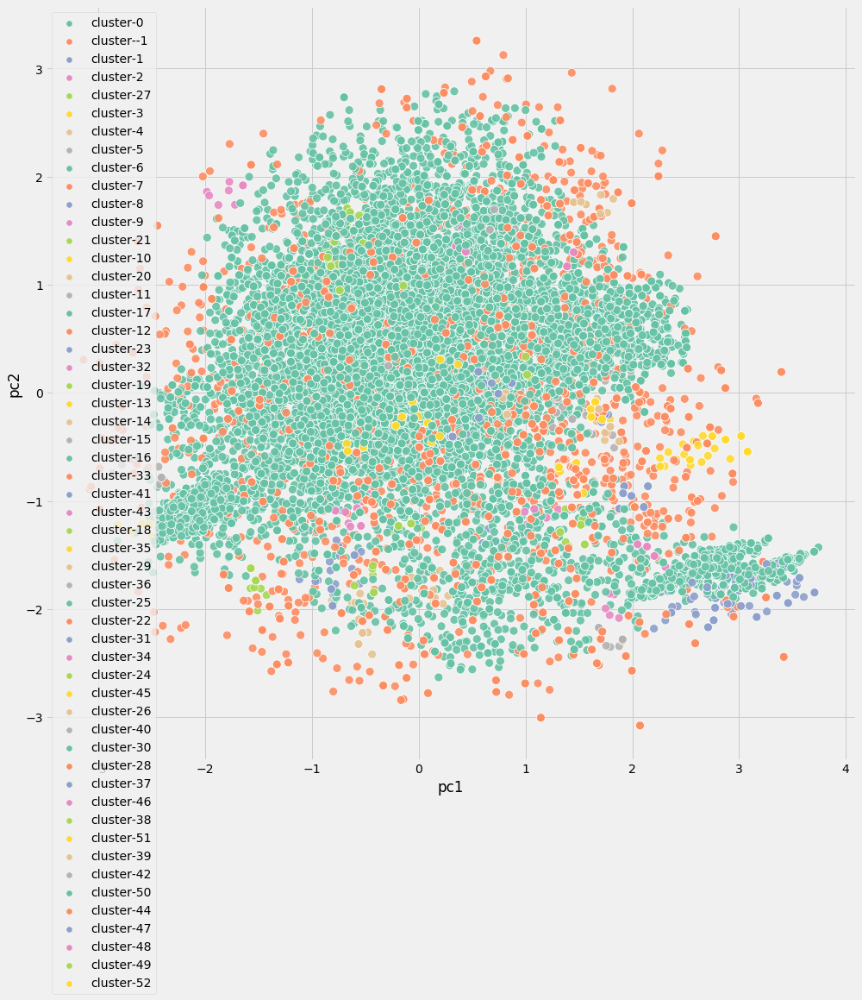

In [440]:
fig = plt.figure(figsize=(15, 15))
sns.scatterplot(pca_df.iloc[:,0], pca_df.iloc[:,1], s=100, alpha=0.9, palette='Set2', hue=["cluster-{}".format(x) for x in labels])

In [438]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = db.labels_

trace = go.Scatter3d(x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)

fig.update_layout(title="'DBSCAN Clusters (53) Derived from PCA'", font=dict(size=12,))
fig.show()

In [441]:
pca_eps_values = np.arange(0.5,1.5,0.1) # eps values to be investigated
pca_min_samples = np.arange(2,7) # min_samples values to be investigated
pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))

In [454]:
# iterativing through
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []

for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(pca_df)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
    pca_sil_score.append(silhouette_score(pca_df, pca_dbscan_cluster.labels_))

KeyboardInterrupt: 

In [453]:
pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])


In [444]:
pca_eps_min_df

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,63,0.033071,0.5,2
1,21,0.216123,0.5,3
2,18,0.215285,0.5,4
3,12,0.268298,0.5,5
4,11,0.269962,0.5,6
5,44,0.089397,0.6,2
6,14,0.234191,0.6,3
7,11,0.234107,0.6,4
8,5,0.565576,0.6,5
9,4,0.568601,0.6,6


In [459]:
db = DBSCAN(eps=0.5, min_samples=3).fit(pca_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % silhouette_score(pca_df, labels))


Estimated number of clusters: 20
Estimated number of noise points: 102
Silhouette Coefficient: 0.216


In [455]:
set(labels)

{-1, 0, 1, 2, 3, 4, 5}

In [460]:
np.unique(labels, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
        16, 17, 18, 19]),
 array([  102, 14598,     3,   161,     3,     5,    37,     7,     3,
            4,    12,    10,    14,     4,     6,     4,     4,     4,
            8,     6,     4]))

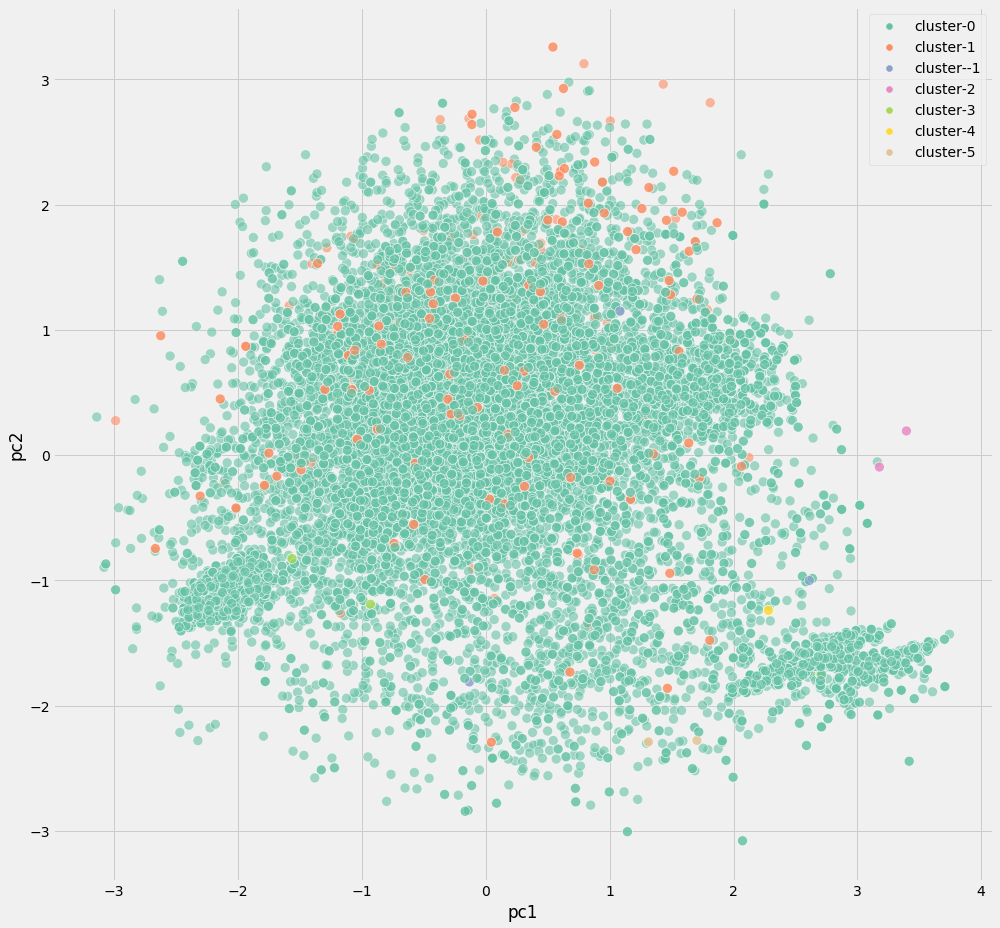

In [451]:
fig = plt.figure(figsize=(15, 15))
sns.scatterplot(pca_df.iloc[:,0], pca_df.iloc[:,1], s=100, alpha=0.6, palette='Set2', hue=["cluster-{}".format(x) for x in labels])

In [456]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = db.labels_

trace = go.Scatter3d(x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)

fig.update_layout(title='DBSCAN clusters (6) Derived from PCA', font=dict(size=12,))
fig.show()

In [328]:
dbscan_profile = pd.concat([df, pd.DataFrame({'dbscan_clusters':labels})], axis=1)
dbscan_profile

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dbscan_clusters
0,0.38,0.53,2,157,3,0,0,0
1,0.80,0.86,5,262,6,0,0,0
2,0.11,0.88,7,272,4,0,0,0
3,0.72,0.87,5,223,5,0,0,0
4,0.37,0.52,2,159,3,0,0,0
...,...,...,...,...,...,...,...,...
14994,0.40,0.57,2,151,3,0,0,0
14995,0.37,0.48,2,160,3,0,0,0
14996,0.37,0.53,2,143,3,0,0,0
14997,0.11,0.96,6,280,4,0,0,0


In [404]:
eps_values = np.arange(1.2,3,0.1) 
min_samples = np.arange(2,7) 
dbscan_params = list(product(eps_values, min_samples))

In [405]:
no_of_clusters = []
sil_score = []
epsvalues = []
min_samp = []

for p in dbscan_params:
    dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(df_scale)
    epsvalues.append(p[0])
    min_samp.append(p[1])
    no_of_clusters.append(len(np.unique(dbscan_cluster.labels_)))
    sil_score.append(silhouette_score(df_scale, dbscan_cluster.labels_))

In [406]:
eps_min = list(zip(no_of_clusters, sil_score, epsvalues, min_samp))
eps_min_df = pd.DataFrame(eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])


In [409]:
eps_min_df[50:90]

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
50,6,0.292206,2.2,2
51,6,0.292206,2.2,3
52,5,0.292915,2.2,4
53,5,0.292915,2.2,5
54,5,0.292915,2.2,6
55,5,0.292915,2.3,2
56,5,0.292915,2.3,3
57,5,0.292915,2.3,4
58,5,0.292915,2.3,5
59,5,0.292915,2.3,6


In [410]:
db = DBSCAN(eps=2.9, min_samples=5).fit(df_scale)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % silhouette_score(df_scale, labels))


Estimated number of clusters: 2
Estimated number of noise points: 0
Silhouette Coefficient: 0.585


In [411]:
np.unique(labels, return_counts=True)

(array([0, 1]), array([14680,   319]))